# Imported necessary libraries 

In [1]:
# utilities
import re
import numpy as np
import pandas as pd
# plotting
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# nltk
import nltk
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
# sklearn
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import BernoulliNB,GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.metrics import confusion_matrix, classification_report

import warnings
warnings.filterwarnings('ignore')

# EDA

In [2]:
hotel = pd.read_excel("hotel_reviews (1).xlsx")
hotel

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5
...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5
20487,great location price view hotel great quick pl...,4
20488,"ok just looks nice modern outside, desk staff ...",2
20489,hotel theft ruined vacation hotel opened sept ...,1


In [6]:
 # EDA 

In [7]:
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5


In [8]:
hotel.tail()

,Review,Rating
20486,"best kept secret 3rd time staying charm, not 5...",5
20487,great location price view hotel great quick pl...,4
20488,"ok just looks nice modern outside, desk staff ...",2
20489,hotel theft ruined vacation hotel opened sept ...,1
20490,"people talking, ca n't believe excellent ratin...",2


In [9]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20491 entries, 0 to 20490
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Review  20491 non-null  object
 1   Rating  20491 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 320.3+ KB


In [3]:
hotel.describe().T

,count,mean,std,min,25%,50%,75%,max
Rating,20491.0,3.952223,1.23303,1.0,3.0,4.0,5.0,5.0


In [11]:
hotel.isna().sum()

Review    0
Rating    0
dtype: int64

In [12]:
hotel.duplicated().sum()

0

In [13]:
hotel.Rating.value_counts()

5    9054
4    6039
3    2184
2    1793
1    1421
Name: Rating, dtype: int64

# DATA VISUALIZATION 

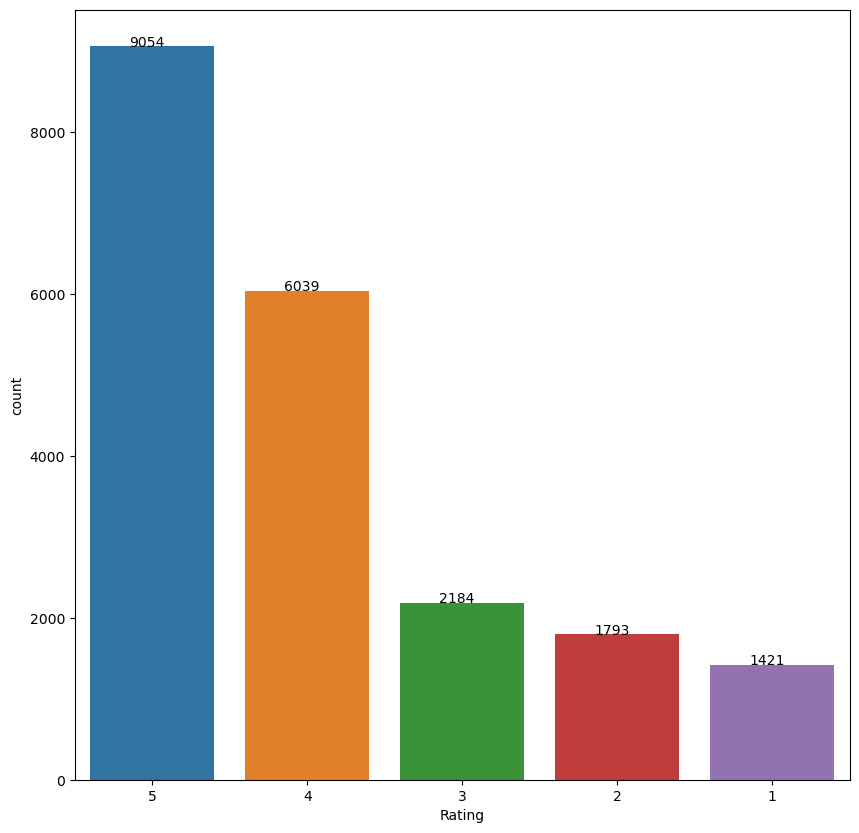

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,10))
ax = sns.countplot(x= hotel["Rating"],  data= hotel, order = hotel["Rating"].value_counts().index )
for p, label in zip(ax.patches, hotel["Rating"].value_counts()):   
    ax.annotate(label, (p.get_x()+0.25, p.get_height()+0.5))

In [15]:
# pie chart

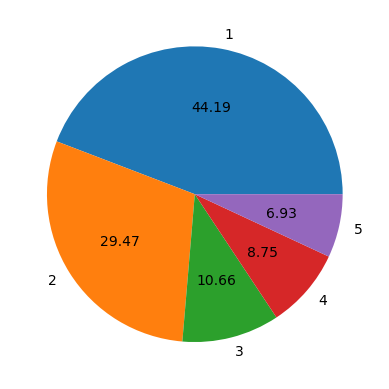

In [16]:
plt.pie(hotel['Rating'].value_counts(),labels =[1,2,3,4,5],autopct="%0.2f" )
plt.show()

N-gram Analysis - Bigram and Trigram

In [17]:
import pandas as pd
import re
from nltk.util import ngrams
from collections import Counter
import csv
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import nltk

In [18]:
def cleanReviews(documents):
    cleanedReviews = []
    for document in documents:
        s = re.sub(r'[^a-zA-Z0-9\s]', '', document)
        s = re.sub('\s+',' ', s)
        s = str(s).lower()
        tokens = [token for token in s.split(" ") if token != ""]
        tokens = [word for word in tokens if word not in stopwords.words('english')]
        tokens = [word for word in tokens if word not in ['alexa', 'echo', 'dot']]
        review = ' '.join(tokens)
        cleanedReviews.append(review)
    return(cleanedReviews)

In [19]:
def documentNgrams(documents, size):
    ngrams_all = []
    for document in documents:
        tokens = document.split()
        if len(tokens) <= size:
            continue
        else:
            output = list(ngrams(tokens, size))
        for ngram in output:
            ngrams_all.append(" ".join(ngram))
    cnt_ngram = Counter()
    for word in ngrams_all:
        cnt_ngram[word] += 1
    hotel = pd.DataFrame.from_dict(cnt_ngram, orient='index').reset_index()
    hotel = hotel.rename(columns={'index':'words', 0:'count'})
    hotel = hotel.sort_values(by='count', ascending=False)
    hotel= hotel.head(15)
    hotel = hotel.sort_values(by='count')
    return(hotel)

In [20]:
def plotNgrams(documents):
    unigrams = documentNgrams(documents, 1)
    bigrams = documentNgrams(documents, 2)
    trigrams = documentNgrams(documents, 3)
    
    # Set plot figure size
    fig = plt.figure(figsize = (20, 7))
    plt.subplots_adjust(wspace=.5)

    ax = fig.add_subplot(131)
    ax.barh(np.arange(len(unigrams['words'])), unigrams['count'], align='center', alpha=.5)
    ax.set_title('Unigrams')
    plt.yticks(np.arange(len(unigrams['words'])), unigrams['words'])
    plt.xlabel('Count')

    ax2 = fig.add_subplot(132)
    ax2.barh(np.arange(len(bigrams['words'])), bigrams['count'], align='center', alpha=.5)
    ax2.set_title('Bigrams')
    plt.yticks(np.arange(len(bigrams['words'])), bigrams['words'])
    plt.xlabel('Count')
    ax3 = fig.add_subplot(133)
    ax3.barh(np.arange(len(trigrams['words'])), trigrams['count'], align='center', alpha=.5)
    ax3.set_title('Trigrams')
    plt.yticks(np.arange(len(trigrams['words'])), trigrams['words'])
    plt.xlabel('Count')

    plt.show()

In [21]:
def textTrends(documents):
    cleanedReviews = cleanReviews(documents)
    plotNgrams(cleanedReviews)

In [22]:
hotel = pd.read_excel('hotel_reviews (1).xlsx')
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5


In [23]:
posReviews = hotel[hotel['Rating'] > 3]
negReviews = hotel[hotel['Rating'] < 3]


In [24]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kjlja\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

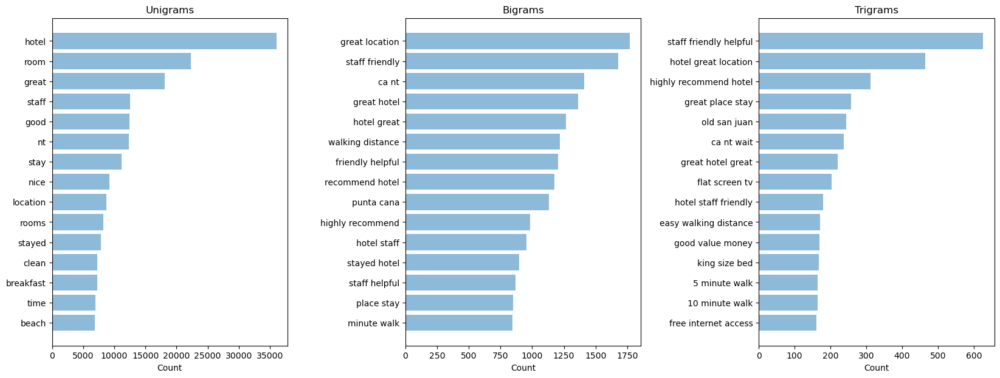

In [25]:
textTrends(posReviews['Review'])

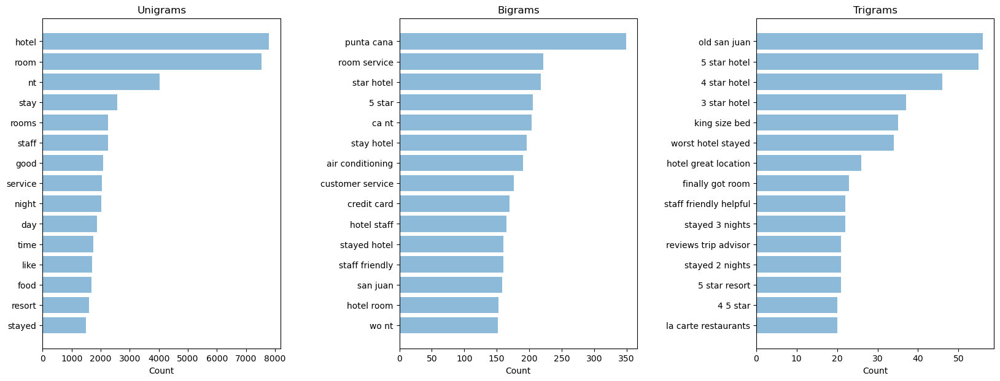

In [26]:
textTrends(negReviews['Review'])

In [27]:
# DATA PREPROCESSING

In [28]:
!pip install nltk

In [29]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kjlja\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [30]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kjlja\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [31]:
#importing word tokenizer

In [32]:
from nltk import word_tokenize

In [33]:
# import stopwords

In [34]:
# creating the custom function

In [35]:
def convert_to_lower(text):
    return text.lower()

In [36]:
hotel['Review'] = hotel['Review'].apply(lambda x: convert_to_lower(x))
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5


In [37]:
#Removing numbers and other numeric values function
def remove_numbers(text):
    number_pattern = r'\d+'
    without_number = re.sub(pattern=number_pattern, repl=" ", string=text)
    return without_number

In [38]:
hotel['Review'] = hotel['Review'].apply(lambda x: remove_numbers(x))
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not * experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5


In [39]:
import string

In [40]:
#Removing punctuations function
def remove_punctuation(text):
    return text.translate(str.maketrans('', '', string.punctuation))

In [41]:

hotel['Review'] = hotel['Review'].apply(lambda x: remove_punctuation(x))
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not experience hotel monaco seatt...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5


In [42]:
#Removing stop words function
def remove_stopwords(text):
    removed = []
    stop_words = list(stopwords.words("english"))
    tokens = word_tokenize(text)
    for i in range(len(tokens)):
        if tokens[i] not in stop_words:
            removed.append(tokens[i])
    return " ".join(removed)

In [43]:
hotel['Review'] = hotel['Review'].apply(lambda x: remove_punctuation(x))
hotel.head()


,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not experience hotel monaco seatt...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5


In [44]:
#Remove extra white spaces function
def remove_extra_white_spaces(text):
    single_char_pattern = r'\s+[a-zA-Z]\s+'
    without_sc = re.sub(pattern=single_char_pattern, repl=" ", string=text)
    return without_sc

In [45]:
hotel['Review'] = hotel['Review'].apply(lambda x: remove_extra_white_spaces(x))
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not experience hotel monaco seatt...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5


In [46]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\kjlja\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [47]:
#Lemmatizing function
def lemmatizing(text):
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text)
    for i in range(len(tokens)):
        lemma_word = lemmatizer.lemmatize(tokens[i])
        tokens[i] = lemma_word
    return " ".join(tokens)

In [48]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\kjlja\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [49]:
hotel['Review'] = hotel['Review'].apply(lambda x: lemmatizing(x))
hotel.head()

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice room not experience hotel monaco seattle ...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5


In [50]:
#Calculating the length of each data sample after performing text cleaning

In [51]:
hotel['length_after_cleaning'] = hotel['Review'].apply(lambda x: len(x))


In [52]:
hotel.head()


,Review,Rating,length_after_cleaning
0,nice hotel expensive parking got good deal sta...,4,570
1,ok nothing special charge diamond member hilto...,2,1619
2,nice room not experience hotel monaco seattle ...,3,1341
3,unique great stay wonderful time hotel monaco ...,5,573
4,great stay great stay went seahawk game awesom...,5,1218


In [53]:
# word cloud

In [54]:
Hotel=hotel
Hotel

,Review,Rating,length_after_cleaning
0,nice hotel expensive parking got good deal sta...,4,570
1,ok nothing special charge diamond member hilto...,2,1619
2,nice room not experience hotel monaco seattle ...,3,1341
3,unique great stay wonderful time hotel monaco ...,5,573
4,great stay great stay went seahawk game awesom...,5,1218
...,...,...,...
20486,best kept secret rd time staying charm not sta...,5,696
20487,great location price view hotel great quick pl...,4,296
20488,ok just look nice modern outside desk staff nt...,2,424
20489,hotel theft ruined vacation hotel opened sept ...,1,5347


In [55]:
from matplotlib.pyplot import imread
from matplotlib import pyplot as plt
from wordcloud import WordCloud
%matplotlib inline 

In [56]:
Hotel = [Review.strip() for Review in Hotel.Review]#
Hotel = [Review for Review in Hotel if Review]
Hotel[0:10]

['nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous review did valet parking check quick easy little disappointed nonexistent view room room clean nice size bed comfortable woke stiff neck high pillow not soundproof like heard music room night morning loud bang door opening closing hear people talking hallway maybe just noisy neighbor aveda bath product nice did not goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience having pay parking night',
 'ok nothing special charge diamond member hilton decided chain shot th anniversary seattle start booked suite paid extra website description not suite bedroom bathroom standard hotel room took printed reservation desk showed said thing like tv couch ect desk clerk told oh mixed suite description kimpton website sorry free breakfast got kidding embassy suit sitting room bathroom bedroom unlike kimpton call suite day stay 

In [57]:
review = ' '.join(Hotel)
review

'nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous review did valet parking check quick easy little disappointed nonexistent view room room clean nice size bed comfortable woke stiff neck high pillow not soundproof like heard music room night morning loud bang door opening closing hear people talking hallway maybe just noisy neighbor aveda bath product nice did not goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience having pay parking night ok nothing special charge diamond member hilton decided chain shot th anniversary seattle start booked suite paid extra website description not suite bedroom bathroom standard hotel room took printed reservation desk showed said thing like tv couch ect desk clerk told oh mixed suite description kimpton website sorry free breakfast got kidding embassy suit sitting room bathroom bedroom unlike kimpton call suite day stay offer

In [58]:
#Converting the ratings into two labels of Positive & Negative

hotel['Target'] = hotel['Rating'].apply(lambda x: 1 if x > 3 else 0)

In [59]:
#Reference for original data for encoded value
hotel.head()

,Review,Rating,length_after_cleaning,Target
0,nice hotel expensive parking got good deal sta...,4,570,1
1,ok nothing special charge diamond member hilto...,2,1619,0
2,nice room not experience hotel monaco seattle ...,3,1341,0
3,unique great stay wonderful time hotel monaco ...,5,573,1
4,great stay great stay went seahawk game awesom...,5,1218,1


In [60]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20491 entries, 0 to 20490
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Review                 20491 non-null  object
 1   Rating                 20491 non-null  int64 
 2   length_after_cleaning  20491 non-null  int64 
 3   Target                 20491 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 640.5+ KB


In [61]:
#Checking the count of target variable
hotel['Target'].value_counts()

1    15093
0     5398
Name: Target, dtype: int64

# WORDCLOUD


In [62]:
hotel_positive = hotel[hotel['Review']==1]
hotel_negative = hotel[hotel['Review']==0]

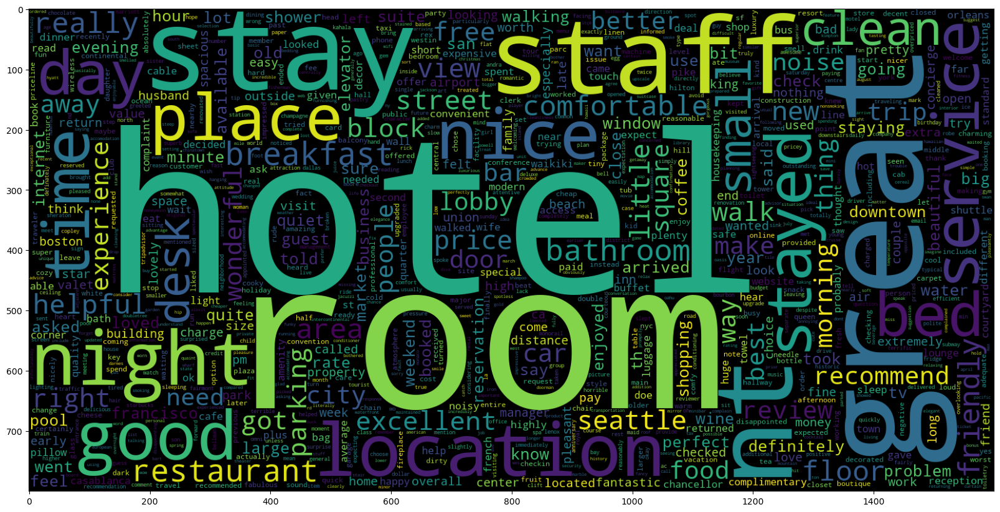

In [63]:
# Plot a cloud of words for hotel positive reviews

hotel_positive = hotel['Review'][:1642]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(hotel_positive))
plt.imshow(wc)

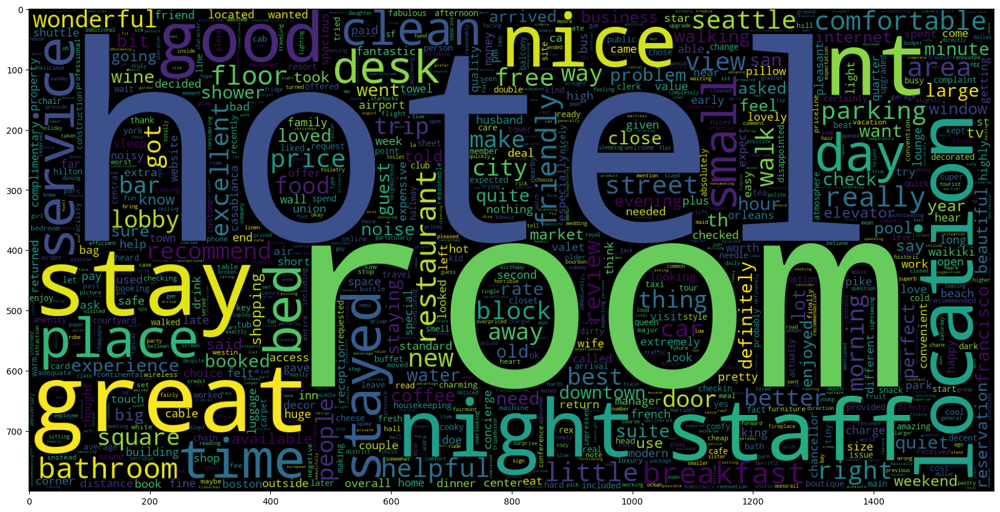

In [64]:
# Plot a cloud of words for hotel negetavie reviews

hotel_negative = hotel['Review'][:1642]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(hotel_negative))
plt.imshow(wc)

# Splitting the dataset


We will split the vectorized dataset into two portions/sets. The first portion will be for model training and the second portion for model testing. We will use the train_test_split method to split the vectorized dataset.

In [65]:
from sklearn.model_selection import train_test_split


In [66]:
X=hotel.Review
Y= hotel.Target

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.1, random_state =42)

# Tf-idf vectorizer

TF-IDF stands for Term Frequency and Inverse Document Frequency,This helps to measure the score in order to get the information retrieval (IR) or summarization.TF-IDF is also used to reflect how relevant a term is in a given document Procedure to calculate TF-IDF by multiplying two metrics: How many times a word appears in a document,And the inverse document frequency of the word across a set of documents



In [67]:
#Tf-idf vectorizer
tf=TfidfVectorizer(ngram_range=(1,2))
#transformed train emails
tf_train=tf.fit_transform(X_train)
#transformed test emails
tf_test=tf.transform(X_test)
print('Tfidf_train:',tf_train.shape)
print('Tfidf_test:',tf_test.shape)

Tfidf_train: (18441, 907819)
Tfidf_test: (2050, 907819)


# Bag of words


Bag of Words model is used to preprocess the text or documentations. It converts the documents into abag of words, which keeps a count of the total occurrences of most frequently used words.Bag-of-Words is one of the most used methods to transform tokens into a set of features.



In [68]:
# countervoctorizer(bog of words)
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
Bow=CountVectorizer(min_df=0,max_df=1,binary=False,ngram_range=(1,2))
#transformed train emails
Bow_train=Bow.fit_transform(X_train)
#transformed test emails
Bow_test=Bow.transform(X_test)
print('BOW_cv_train:',Bow_train.shape)
print('BOW_cv_test:',Bow_test.shape)

BOW_cv_train: (18441, 698116)
BOW_cv_test: (2050, 698116)


# Model Building

              precision    recall  f1-score   support

           0       0.71      0.05      0.10       525
           1       0.75      0.99      0.86      1525

    accuracy                           0.75      2050
   macro avg       0.73      0.52      0.48      2050
weighted avg       0.74      0.75      0.66      2050



<function matplotlib.pyplot.legend(*args, **kwargs)>

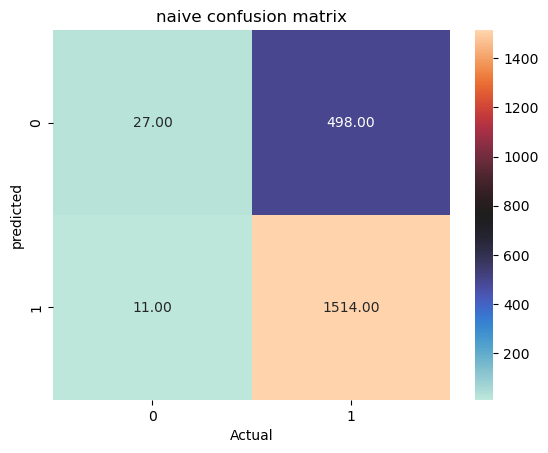

In [69]:
# naive_bayes model
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.naive_bayes import BernoulliNB

model_naive=BernoulliNB()
model_naive.fit(tf_train,Y_train)

# classification report
naive_pred=model_naive.predict(tf_test)
naive_pred=np.ravel(naive_pred)
naive_pred
print(classification_report(Y_test,naive_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test,naive_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('naive confusion matrix')
plt.legend

# Report

This model is not accurate as the value of 0 is 94%.

Clearly Data is imbalance here, there are 2 classes : first class : 0 means Target says'NonAbusive'and second class : 1 means Target says 'Abusive'.

here majority class : 0(23014 samples) and minority class : 1(1642 samples).

Here we have to balance of both classes means here we have to use sampling technique for balance of 2 classes .

There are 2 types of sampling technique :-

#1. RandomOverSampling : in this sampling , converts minority class into 'majority class'

#2. RandonUnderSampling : in this sampling , converts majority class into'minority class'

# RandomUnderSampler(TfidfVectorizer)

In [70]:
#Randomunder Sampler : inbuilt class : to increase means create duplicate 
#records of minority class which equal to majority class
from imblearn.under_sampling import  RandomUnderSampler
# Now apply RandomOverSampler class.
# Create an object of RandomunderSampler class
ros=RandomUnderSampler(random_state=42)

In [71]:
# Check how many samples of class 0,1 and 2 class in Y_train

print('Before Random undersampler:', '\n',  Y_train.value_counts())

# Use inbuilt method fit_resample() of RandomunderSampler class 
X_train_ros,Y_train_ros=ros.fit_resample(tf_train,Y_train)


print('after Random undersampler:', '\n',  Y_train_ros.value_counts())

Before Random undersampler: 
 1    13568
0     4873
Name: Target, dtype: int64
after Random undersampler: 
 0    4873
1    4873
Name: Target, dtype: int64


In [72]:
# Check how many samples of class 0,1 and 2 class in Y_test

print('Before Random undersampler:', '\n',  Y_test.value_counts())

# Use inbuilt method fit_resample() of RandomOverSampler class 
X_test_ros,Y_test_ros=ros.fit_resample(tf_test,Y_test)


print('after Random undersampler:', '\n',  Y_test_ros.value_counts())

Before Random undersampler: 
 1    1525
0     525
Name: Target, dtype: int64
after Random undersampler: 
 0    525
1    525
Name: Target, dtype: int64


              precision    recall  f1-score   support

           0       0.92      0.56      0.70       525
           1       0.68      0.95      0.80       525

    accuracy                           0.76      1050
   macro avg       0.80      0.76      0.75      1050
weighted avg       0.80      0.76      0.75      1050



<function matplotlib.pyplot.legend(*args, **kwargs)>

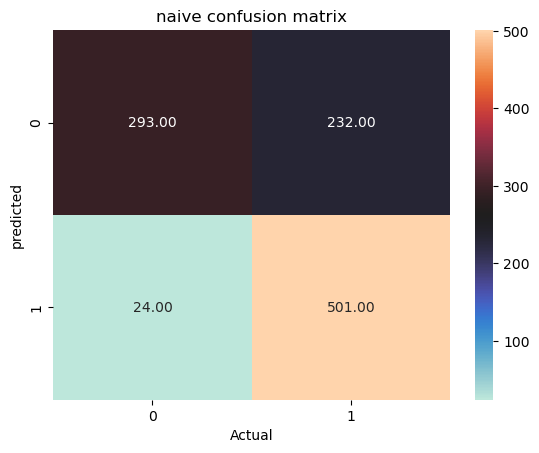

In [73]:
# naive_bayes model
model_naive=BernoulliNB()
model_naive.fit(X_train_ros,Y_train_ros)

# classification report
naive_pred=model_naive.predict(X_test_ros)
naive_pred=np.ravel(naive_pred)
naive_pred
print(classification_report(Y_test_ros,naive_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test_ros,naive_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('naive confusion matrix')
plt.legend

              precision    recall  f1-score   support

           0       0.88      0.87      0.87       525
           1       0.87      0.88      0.88       525

    accuracy                           0.88      1050
   macro avg       0.88      0.88      0.88      1050
weighted avg       0.88      0.88      0.88      1050



<function matplotlib.pyplot.legend(*args, **kwargs)>

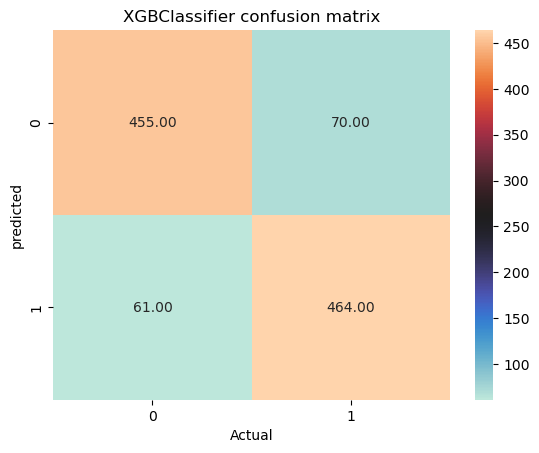

In [74]:
# XG boostclassifier model
from xgboost import XGBClassifier
model_xgboost=XGBClassifier()
model_xgboost.fit(X_train_ros,Y_train_ros)

# classification report
XGboost_pred=model_xgboost.predict(X_test_ros)
XGboost_pred=np.ravel(XGboost_pred)
XGboost_pred
print(classification_report(Y_test_ros,XGboost_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test_ros,XGboost_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('XGBClassifier confusion matrix')
plt.legend

              precision    recall  f1-score   support

           0       0.89      0.84      0.86       525
           1       0.85      0.89      0.87       525

    accuracy                           0.86      1050
   macro avg       0.87      0.86      0.86      1050
weighted avg       0.87      0.86      0.86      1050



<function matplotlib.pyplot.legend(*args, **kwargs)>

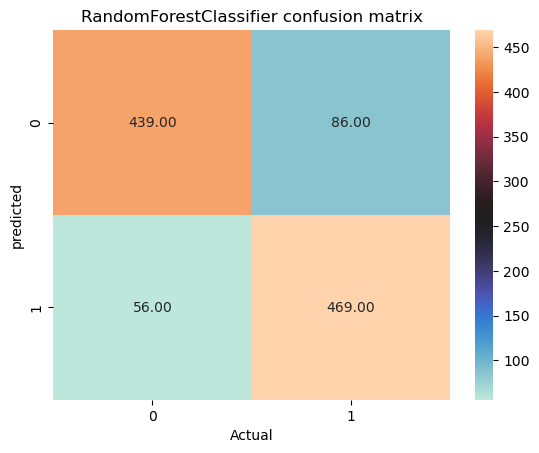

In [83]:
# Randomforest classifier model
from sklearn.ensemble import RandomForestClassifier

model_Random=RandomForestClassifier()
model_Random.fit(X_train_ros,Y_train_ros)

# classification report
Random_pred=model_Random.predict(X_test_ros)
Random_pred=np.ravel(Random_pred)
Random_pred
print(classification_report(Y_test_ros,Random_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test_ros,Random_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('RandomForestClassifier confusion matrix')
plt.legend

              precision    recall  f1-score   support

           0       0.92      0.87      0.90       525
           1       0.88      0.93      0.90       525

    accuracy                           0.90      1050
   macro avg       0.90      0.90      0.90      1050
weighted avg       0.90      0.90      0.90      1050



<function matplotlib.pyplot.legend(*args, **kwargs)>

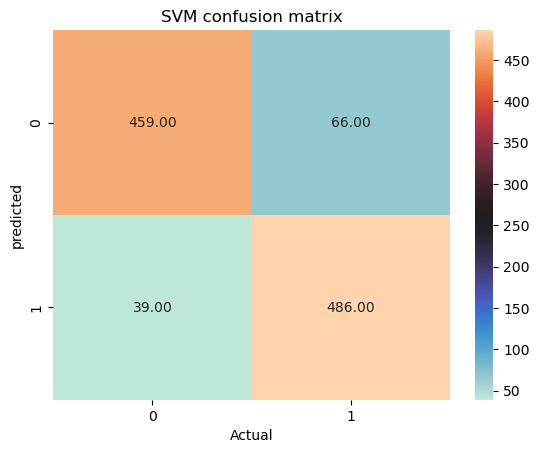

In [84]:
# svm model
from sklearn import svm

model_svm=svm.LinearSVC()
model_svm.fit(X_train_ros,Y_train_ros)

# classification report
SVM_pred=model_svm.predict(X_test_ros)
SVM_pred=np.ravel(SVM_pred)
SVM_pred
print(classification_report(Y_test_ros,SVM_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test_ros,SVM_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('SVM confusion matrix')
plt.legend

              precision    recall  f1-score   support

           0       0.92      0.86      0.89       525
           1       0.87      0.92      0.89       525

    accuracy                           0.89      1050
   macro avg       0.89      0.89      0.89      1050
weighted avg       0.89      0.89      0.89      1050



<function matplotlib.pyplot.legend(*args, **kwargs)>

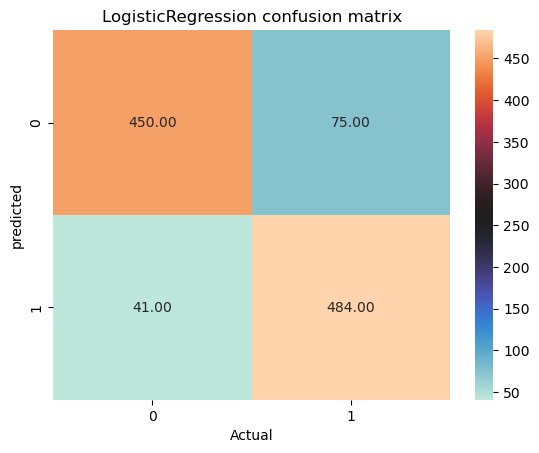

In [85]:
# logistic regression model
from sklearn.linear_model import LogisticRegression

model_logit=LogisticRegression()
model_logit.fit(X_train_ros,Y_train_ros)

# classification report
logit_pred=model_logit.predict(X_test_ros)
logit_pred=np.ravel(logit_pred)
logit_pred
print(classification_report(Y_test_ros,logit_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test_ros,logit_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('LogisticRegression confusion matrix')
plt.legend

              precision    recall  f1-score   support

           0       0.72      0.74      0.73       525
           1       0.74      0.71      0.72       525

    accuracy                           0.73      1050
   macro avg       0.73      0.73      0.73      1050
weighted avg       0.73      0.73      0.73      1050



<function matplotlib.pyplot.legend(*args, **kwargs)>

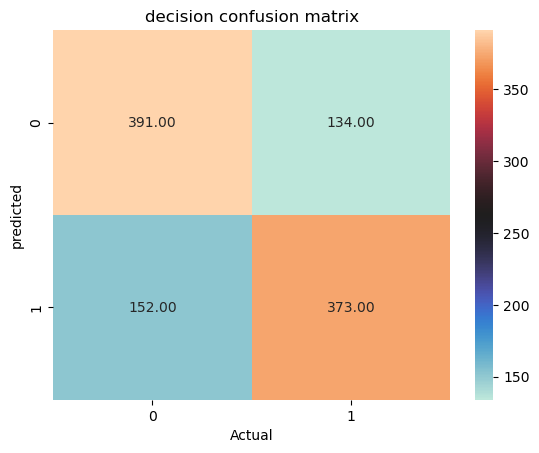

In [91]:
from sklearn.tree import DecisionTreeClassifier

model_decision=DecisionTreeClassifier()
model_decision.fit(X_train_ros,Y_train_ros)

# classification report
decision_pred=model_decision.predict(X_test_ros)
decision_pred=np.ravel(decision_pred)
decision_pred
print(classification_report(Y_test_ros,decision_pred))

#confusion matrix
sns.heatmap(confusion_matrix(Y_test_ros,decision_pred),annot=True,cmap='icefire',fmt='.2f')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.title('decision confusion matrix')
plt.legend

In [87]:
data={"MODEL":pd.Series(['naive_bayes','XG boostclassifier','Randomforest classifier','SVM','logistic regression','Decision tree']),
'Accuracy':pd.Series([model_naive.fit(X_train_ros,Y_train_ros),
model_xgboost.fit(X_train_ros,Y_train_ros),
model_Random.fit(X_train_ros,Y_train_ros),
model_svm.fit(X_train_ros,Y_train_ros),
model_logit.fit(X_train_ros,Y_train_ros),
model_decision.fit(X_train_ros,Y_train_ros)])}

In [88]:
data

{'MODEL': 0                naive_bayes
 1         XG boostclassifier
 2    Randomforest classifier
 3                        SVM
 4        logistic regression
 5              Decision tree
 dtype: object,
 'Accuracy': 0                                        BernoulliNB()
 1    XGBClassifier(base_score=0.5, booster='gbtree'...
 2    (DecisionTreeClassifier(max_features='auto', r...
 3                                          LinearSVC()
 4                                 LogisticRegression()
 5                             DecisionTreeClassifier()
 dtype: object}

# Conclusion

1.To Abserve the all models accuracies ,which model gives the best accuracy to procced the deployemenet on the model

2.In case same accuracys are presented, compared the F1_score,precision and confusion matrics of the models

In [89]:
import pickle
model_file = "model_svm.pkl"
with open(model_file,mode='wb') as model_f:
    pickle.dump(model_svm,model_f)

In [90]:
pickle.dump(tf,open('vectorizer.pkl','wb'))